<a id = "table-of-content"></a>
<p id="part0"></p>
<p style="font-family: Arials; line-height: 2; font-size: 24px; font-weight: bold; letter-spacing: 2px; text-align: center; color: #000000">FLIGHT PRICE PREDICTION</p>
<img src="https://www.usatoday.com/gcdn/presto/2019/06/23/USAT/c3a9f051-bd6c-4b39-b5b9-38244deec783-GettyImages-932651818.jpg?width=660&height=517&fit=crop&format=pjpg&auto=webp" width="100%" align="center"  hspace="5%" vspace="5%"/>
 
# Table Contents
* [Library Call](#Section-one)
* [EDA](#Section-two)
 * [Price Analysis](#subsection-two-of-section-1)
 * [Airline ticket price](#subsection-two-of-section-2)
 * [Source City](#subsection-two-of-section-3)
 * [Destination City](#subsection-two-of-section-4)
 * [Days left vs Price based on Source city](#subsection-two-of-section-5)
 * [Days left vs Price based on Destination_city](#subsection-two-of-section-6)
 * [Departure Time Analysis](#subsection-two-of-section-7)
 * [Stops Analysis](#subsection-two-of-section-8)
 *[Arrival Time Analysis](#subsection-two-of-section-9)
 * [Source City Analysis](#subsection-two-of-section-10)
* [Data Preprocessing](#Section-three)
 * [Scaling](#subsection-three-of-section-1)
 * [Encoding](#subsection-three-of-section-2)
* [Modeling](#Section-four)
 * [Pick Best model for this dataset](#subsection-four-of-section-1)
* [Create a single prediction](#Section-five)
* [Save and load the model](#Section-six)

## ABOUT DATASET
Dataset contains information about flight booking options from the website Easemytrip for

flight travel between India's top 6 metro cities. There are 300261 datapoints and 11 
features in the cleaned dataset.

### FEATURES

The various features of the cleaned dataset are explained below:

**Airline**: The name of the airline company is stored in the airline column. It is a categorical feature having 6 different airlines.

**Flight**: Flight stores information regarding the plane's flight code. It is a categorical feature.

**Source City**: City from which the flight takes off. It is a categorical feature having 6 unique cities.

**Departure Time**: This is a derived categorical feature obtained created by grouping time periods into bins. It stores information about the departure time and have 6 unique time labels.

**Stops**: A categorical feature with 3 distinct values that stores the number of stops between the source and destination cities.

**Arrival Time**: This is a derived categorical feature created by grouping time intervals into bins. It has six distinct time labels and keeps information about the arrival time.

**Destination City**: City where the flight will land. It is a categorical feature having 6 unique cities.

**Class**: A categorical feature that contains information on seat class; it has two distinct values: Business and Economy.

**Duration**: A continuous feature that displays the overall amount of time it takes to travel between cities in hours.

**Days Left**: This is a derived characteristic that is calculated by subtracting the trip date by the booking date.

**Price**: Target variable stores information of the ticket price.

<a id="Section-one"> </a>
# Library Call

In [1]:
import pandas as pd 
import numpy as np 
import  seaborn as sns 
import plotly.express as px 
import matplotlib.pyplot  as  plt 
from sklearn.preprocessing import OneHotEncoder,MinMaxScaler,LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,Ridge
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor,BaggingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score,mean_squared_error

In [2]:
clean_df = pd.read_csv('/kaggle/input/flight-price-prediction/Clean_Dataset.csv')

In [3]:
clean_df

,Unnamed: 0,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...,...
300148,300148,Vistara,UK-822,Chennai,Morning,one,Evening,Hyderabad,Business,10.08,49,69265
300149,300149,Vistara,UK-826,Chennai,Afternoon,one,Night,Hyderabad,Business,10.42,49,77105
300150,300150,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Business,13.83,49,79099
300151,300151,Vistara,UK-828,Chennai,Early_Morning,one,Evening,Hyderabad,Business,10.00,49,81585


In [4]:
clean_df.columns

Index(['Unnamed: 0', 'airline', 'flight', 'source_city', 'departure_time',
       'stops', 'arrival_time', 'destination_city', 'class', 'duration',
       'days_left', 'price'],
      dtype='object')

<a id="Section-two"> </a>

# EDA


<a id ='subsection-two-of-section-1'></a>
## Price Analysis

In [5]:
fig = px.histogram(data_frame=clean_df,
                   x ='price',
                   nbins=20,marginal='box',
                   color_discrete_sequence=['#6c3483'],
                   text_auto=True,title='The Distribution of Flight Price')
fig.update_layout()
fig.show()

In [6]:
fig = px.histogram(data_frame=clean_df,
                   x ='price',
                   nbins=20,marginal='box',
                   color='class',
                   text_auto=True,title='The Distribution of Flight Price vs Class')
fig.update_layout()
fig.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



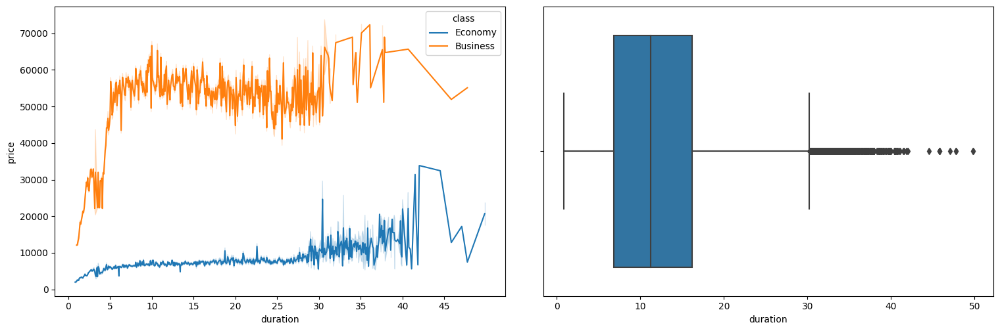

In [7]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
plt.tight_layout()
# Left ax
sns.lineplot(x='duration', y='price', data=clean_df, ax=ax[0], hue='class').set_xticks(np.arange(0, 50, 5))
# Right AX
sns.boxplot(data=clean_df, x='duration', ax=ax[1])
plt.show()

<a id ='subsection-two-of-section-2'></a>

## Airline ticket price

<Axes: xlabel='airline', ylabel='price'>

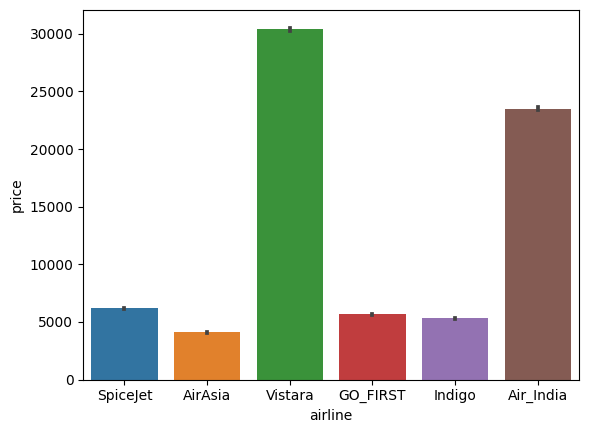

In [8]:
sns.barplot(data=clean_df,x='airline',y='price')

<a id ='subsection-two-of-section-3'></a>

## Source City

Text(0.5, 1.0, 'Source_city by Frequency')

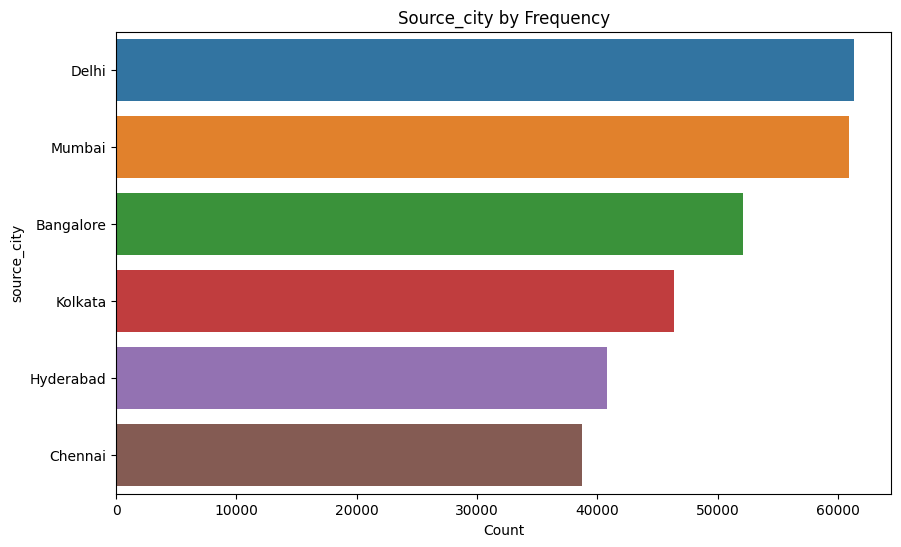

In [9]:

source_count =clean_df.source_city.value_counts().reset_index(name='Count')
plt.figure(figsize=(10,6))
sns.barplot(data=source_count,y='source_city',x='Count')
plt.title("Source_city by Frequency")


<a id ='subsection-two-of-section-4'></a>

## Destination City

Text(0.5, 1.0, 'Destination_city by Frequency')

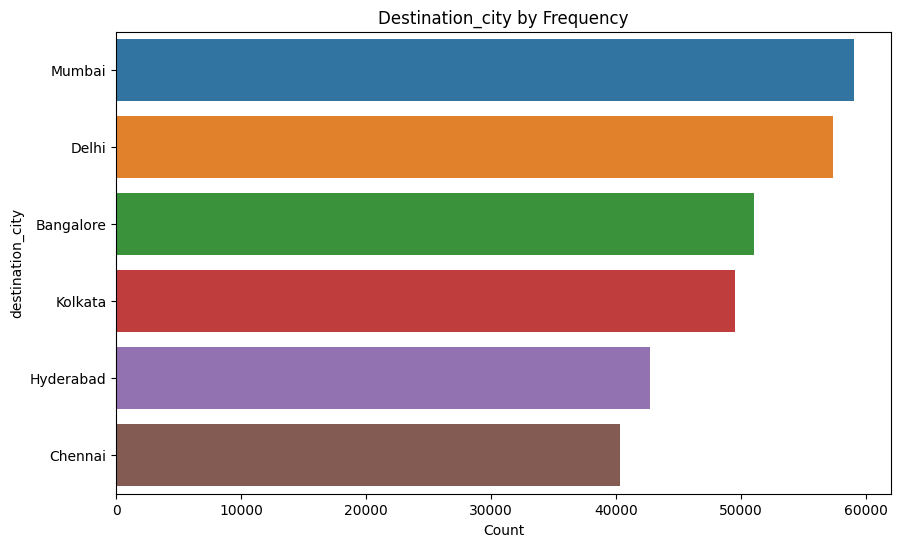

In [10]:

city_count =clean_df.destination_city.value_counts().reset_index(name='Count')
plt.figure(figsize=(10,6))
sns.barplot(data=city_count,y='destination_city',x='Count')
plt.title("Destination_city by Frequency")

<a id ='subsection-two-of-section-5'></a>

## Days left vs Price based on Source city

In [11]:
fig = px.scatter(data_frame=clean_df,
                 x='days_left',
                 y='price',
                 color='source_city',
                 title='Days left vs Price based on Source city'
                )
fig.show()

<a id ='subsection-two-of-section-6'></a>

## Days left vs Price based on Destination_city

In [12]:
fig = px.scatter(data_frame=clean_df,
                 x='days_left',
                 y='price',
                 color='destination_city',
                 title='Days left vs Price based on Destination_city'
                )
fig.show()

<a id ='subsection-two-of-section-7'></a>

## Departure Time Analysis

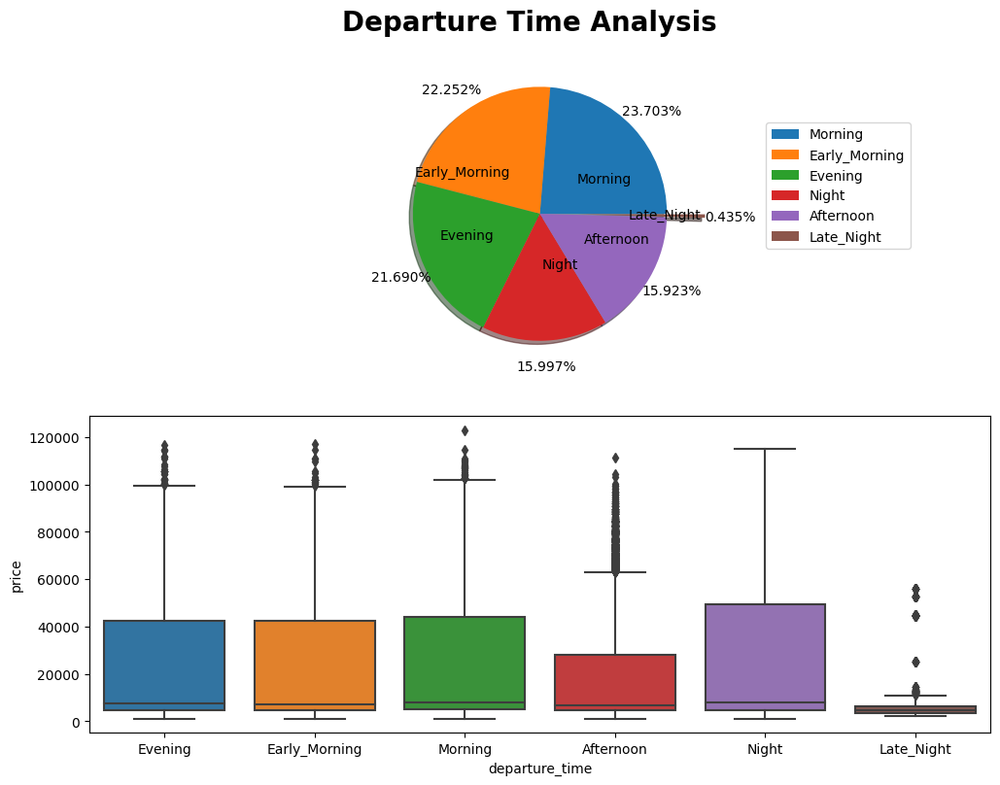

In [13]:
fig, ax = plt.subplots(2, 1, figsize=(10, 8))
fig.suptitle('Departure Time Analysis', fontsize=20, fontweight='bold')
plt.tight_layout()
# Top ax
labels = clean_df.departure_time.value_counts().index.tolist()
explode = (0, 0, 0, 0, 0, 0.3)
ax[0].pie(clean_df.departure_time.value_counts(), autopct='%.3f%%', labels=labels, shadow=True, pctdistance=1.2, labeldistance=0.4, explode=explode)
ax[0].legend(bbox_to_anchor=(1, 1), loc=2, borderaxespad=5)

# Bottom ax
sns.boxplot(x='departure_time', y='price', data=clean_df, ax=ax[1])
plt.show()

<a id ='subsection-two-of-section-8'></a>

## Stops Analysis

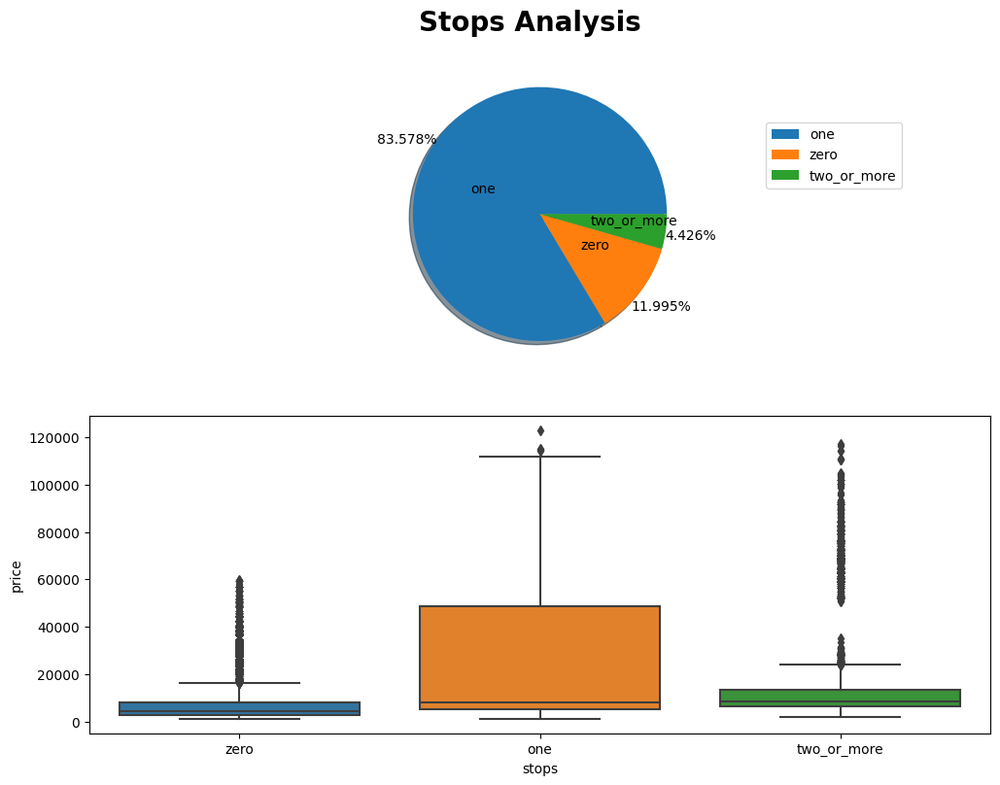

In [14]:
fig, ax = plt.subplots(2, 1, figsize=(10, 8))
fig.suptitle('Stops Analysis', fontsize=20, fontweight='bold')
plt.tight_layout()
# Top ax
labels = clean_df.stops.value_counts().index.tolist()

ax[0].pie(clean_df.stops.value_counts(), autopct='%.3f%%', labels=labels, shadow=True, pctdistance=1.2, labeldistance=0.4)
ax[0].legend(bbox_to_anchor=(1, 1), loc=2, borderaxespad=5)

# Bottom ax
sns.boxplot(x='stops', y='price', data=clean_df, ax=ax[1])
plt.show()

<a id ='subsection-two-of-section-9'></a>

## Arrival Time Analysis

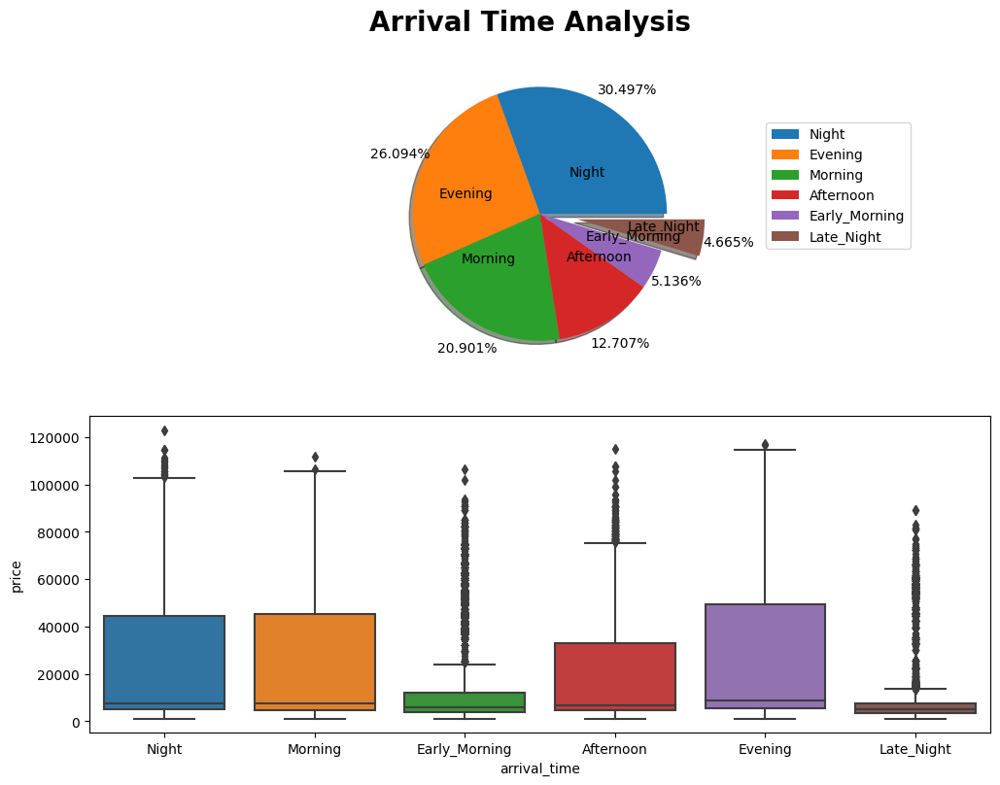

In [15]:
fig, ax = plt.subplots(2, 1, figsize=(10, 8))
fig.suptitle('Arrival Time Analysis', fontsize=20, fontweight='bold')
plt.tight_layout()
# Top ax
labels = clean_df.arrival_time.value_counts().index.tolist()
explode = (0, 0, 0, 0, 0, 0.3)
ax[0].pie(clean_df.arrival_time.value_counts(), autopct='%.3f%%', labels=labels, shadow=True, pctdistance=1.2, labeldistance=0.4, explode=explode)
ax[0].legend(bbox_to_anchor=(1, 1), loc=2, borderaxespad=5)

# Bottom ax
sns.boxplot(x='arrival_time', y='price', data=clean_df, ax=ax[1])
plt.show()

<a id ='subsection-two-of-section-10'></a>

## Source City Analysis

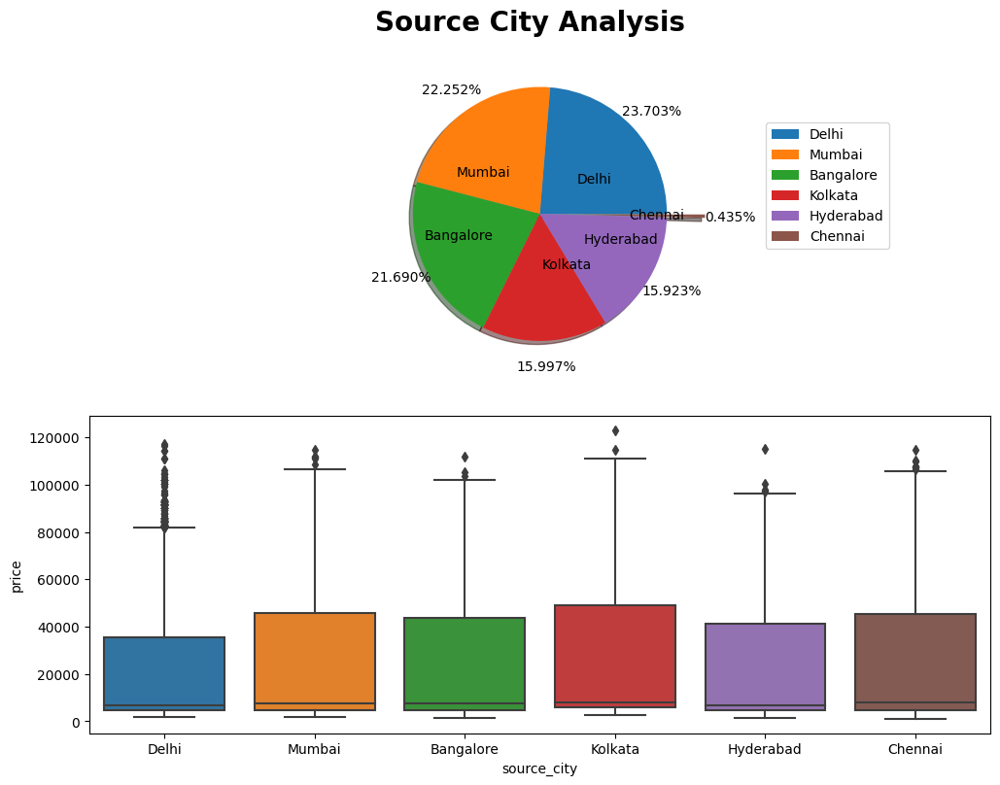

In [16]:
fig, ax = plt.subplots(2, 1, figsize=(10, 8))
fig.suptitle('Source City Analysis', fontsize=20, fontweight='bold')
plt.tight_layout()
# Top ax
labels = clean_df.source_city.value_counts().index.tolist()
explode = (0, 0, 0, 0, 0, 0.3)
ax[0].pie(clean_df.departure_time.value_counts(), autopct='%.3f%%', labels=labels, shadow=True, pctdistance=1.2, labeldistance=0.4, explode=explode)
ax[0].legend(bbox_to_anchor=(1, 1), loc=2, borderaxespad=5)

# Bottom ax
sns.boxplot(x='source_city', y='price', data=clean_df, ax=ax[1])
plt.show()

<a id ='Section-three'></a>

# Data Preprocessing 

In [17]:
# remove the outlier
clean_df = clean_df[clean_df.price <=100000]

In [18]:
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 300045 entries, 0 to 300152
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        300045 non-null  int64  
 1   airline           300045 non-null  object 
 2   flight            300045 non-null  object 
 3   source_city       300045 non-null  object 
 4   departure_time    300045 non-null  object 
 5   stops             300045 non-null  object 
 6   arrival_time      300045 non-null  object 
 7   destination_city  300045 non-null  object 
 8   class             300045 non-null  object 
 9   duration          300045 non-null  float64
 10  days_left         300045 non-null  int64  
 11  price             300045 non-null  int64  
dtypes: float64(1), int64(3), object(8)
memory usage: 29.8+ MB


In [19]:
clean_df.nunique()

Unnamed: 0          300045
airline                  6
flight                1561
source_city              6
departure_time           6
stops                    3
arrival_time             6
destination_city         6
class                    2
duration               476
days_left               49
price                12088
dtype: int64

In [20]:
clean_df.columns

Index(['Unnamed: 0', 'airline', 'flight', 'source_city', 'departure_time',
       'stops', 'arrival_time', 'destination_city', 'class', 'duration',
       'days_left', 'price'],
      dtype='object')

In [21]:
inputs_cols=['airline',  'source_city', 'departure_time','stops', 'arrival_time',
            'destination_city', 'class', 'duration','days_left', ]
targets_col='price'

In [22]:
inputs_dataset = clean_df[inputs_cols].copy()
targets_set    = clean_df[targets_col].copy()

In [23]:
numeric_cols = inputs_dataset.select_dtypes(include=np.number).columns.tolist()
categorical_cols = inputs_dataset.select_dtypes(include='object').columns.tolist()

<a id='subsection-three-of-section-1'></a>
## Scaling

In [24]:
scaler = MinMaxScaler()
scaler.fit(inputs_dataset[numeric_cols])
inputs_dataset[numeric_cols] = scaler.transform(inputs_dataset[numeric_cols])

<a id='subsection-three-of-section-2'></a>
## Encoding

In [25]:
encoder = OneHotEncoder(sparse_output=False,handle_unknown='ignore')
encoder.fit(inputs_dataset[categorical_cols])
encoder_cols = encoder.get_feature_names_out(categorical_cols)
inputs_dataset[encoder_cols]=encoder.transform(inputs_dataset[categorical_cols])

In [26]:
X = pd.concat([inputs_dataset[numeric_cols], inputs_dataset[encoder_cols]],axis=1)
y = targets_set

<a id='Section-four'></a>
# Modeling

In [27]:
xtrain,xtest,ytrain,ytest = train_test_split(X,y,test_size=.20,random_state=42)

In [28]:
lr = LinearRegression()
lr.fit(xtrain,ytrain)

LinearRegression()

In [29]:
lr.predict(xtest)

array([ 5408. ,  3168. , 51342.5, ..., 10874. , 11610. ,  8530. ])

In [30]:
lr_score= r2_score(ytest,lr.predict(xtest))
lr_score

0.9126646569363885

<a id='subsection-four-of-section-1'></a>
## Pick Best model for this dataset

In [31]:
# pick different model and test which is better 
Linear_reg = LinearRegression(),
Ride_reg= Ridge()
XGBoost = XGBRegressor()
Random_forest = RandomForestRegressor()
Ada_boost = AdaBoostRegressor()
Grad_boost = GradientBoostingRegressor()
Bagging= BaggingRegressor()   

In [32]:
model_li = [Ride_reg,XGBoost,Random_forest,Ada_boost,Grad_boost,Bagging]

In [33]:
Score =[]
for model in model_li:
    model.fit(xtrain,ytrain)
    Score.append(r2_score(ytest,model.predict(xtest)))

In [34]:
 Score.append(lr_score) 


In [35]:
Score

[0.9126649205332987,
 0.9783280191255306,
 0.9861504809039133,
 0.9280349581488031,
 0.9540028261192841,
 0.9850328897404611,
 0.9126646569363885]

Text(0.5, 1.0, 'R2 Score Analysis ')

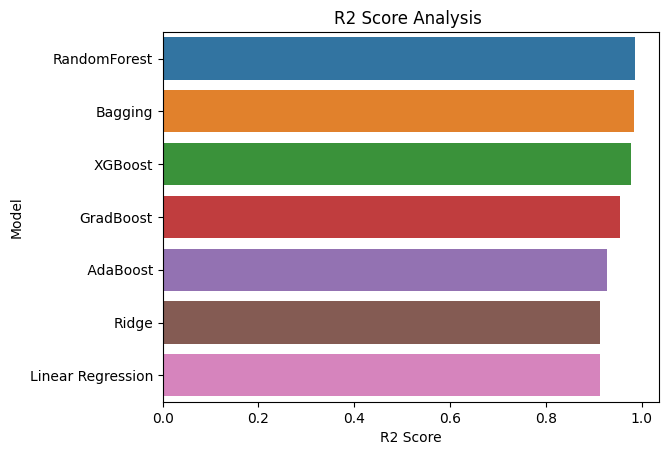

In [36]:
# pick a best model
di={
    "Model":['Ridge','XGBoost','RandomForest',' AdaBoost','GradBoost',
             'Bagging','Linear Regression'],
   "R2 Score":Score}

score_df = pd.DataFrame(di)
score_df=score_df.nlargest(columns='R2 Score',n=7)
sns.barplot(data=score_df,y="Model",x='R2 Score')
plt.title("R2 Score Analysis ")

In [37]:
# our Final Model  

Random_forest.fit(xtrain,ytrain)
print("The R2 score of Random Forest : ",r2_score(ytest,Random_forest.predict(xtest)))

The R2 score of Random Forest :  0.9861895911517712


<a id ='Section-five'></a>
# Create a single prediction

In [38]:
new_input = {
    'airline':'Vistara', 
    'flight':'UK-822',
    'source_city':'Chennai', 
    'departure_time':'Morning',
    'stops':'one', 
    'arrival_time':'Evening', 
    'destination_city':'Hyderabad', 
    'class':'Business', 
    'duration':10.00,   
    'days_left':49

}

In [39]:
new_df = pd.DataFrame([new_input])
new_df

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left
0,Vistara,UK-822,Chennai,Morning,one,Evening,Hyderabad,Business,10.0,49


In [40]:
new_df[numeric_cols] = scaler.transform(new_df[numeric_cols])
new_df[encoder_cols]=encoder.transform(new_df[categorical_cols])
X = pd.concat([new_df[numeric_cols], new_df[encoder_cols]],axis=1)

In [41]:
X

,duration,days_left,airline_AirAsia,airline_Air_India,airline_GO_FIRST,airline_Indigo,airline_SpiceJet,airline_Vistara,source_city_Bangalore,source_city_Chennai,...,arrival_time_Morning,arrival_time_Night,destination_city_Bangalore,destination_city_Chennai,destination_city_Delhi,destination_city_Hyderabad,destination_city_Kolkata,destination_city_Mumbai,class_Business,class_Economy
0,0.187143,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [42]:
pred = Random_forest.predict(X)
pred

array([75554.49])

In [43]:
def make_prediction(single_input):
    new_df = pd.DataFrame([new_input])
    new_df[numeric_cols] = scaler.transform(new_df[numeric_cols])
    new_df[encoder_cols]=encoder.transform(new_df[categorical_cols])
    X = pd.concat([new_df[numeric_cols], new_df[encoder_cols]],axis=1)
    pred = Random_forest.predict(X)
    print("The price of the ticket is : ",pred[0])

In [44]:
make_prediction(new_input)

The price of the ticket is :  75554.48999999999


<a id = 'Section-six'></a>
# Save and load the model 

In [45]:
import joblib

In [46]:
model_elements ={
    'model':Random_forest,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': inputs_cols,
    'target_col': targets_col,
    'numeric_cols': numeric_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoder_cols
}

In [47]:
joblib.dump(model_elements,"Flight ticket model.joblib")

['Flight ticket model.joblib']

In [48]:
model_load = joblib.load("Flight ticket model.joblib")

In [49]:
test_preds = model_load['model'].predict(xtest)
test_preds

array([ 8565.86 ,  3650.27 , 60103.57 , ...,  6615.375, 13737.594,
        5441.   ])

In [50]:
r2_score(ytest,test_preds)

0.9861895911517712